# RNN 
- 2 Entradas PwmD, PwmE
- 3 Saidas Theta, X e Y
- 1 Camada
- n neurônios
## Resultados
- R² test Theta: -0.232
- R² test Y: 0.12 
- R² test X: 0.098

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

Datasets = []
PREDICTORS = ["PwmD", "PwmE"]   
TARGET = ["Theta", "X", "Y"]       
TIME_STEPS = 5

for i in range(3):   
    Dataset = pd.read_csv(f"../Dados/Data{i + 1}.csv")
        
    # Ajusta índice pelo tempo
    Dataset.index = (np.arange(0, len(Dataset), 1).astype(float) * 0.07).round(5)
    
    Datasets.append(Dataset)
    
    print(f"++++++++++++++++++++ Dataset {i+1} +++++++++++++++++++++++")
    print(Dataset.head(5))


++++++++++++++++++++ Dataset 1 +++++++++++++++++++++++
        X    Y  Theta    Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7   0.00  0.00  0.0  -0.00   0.00  -0.00   0.00
0.07  0.0  0.7   0.00  0.00  0.0   3.02   3.02  -0.00   0.00
0.14  0.0  0.7   0.00  0.00  0.0   3.02   3.02  45.32  45.32
0.21  0.0  0.7   0.01  0.36  0.0   3.02   3.02  45.32  45.32
0.28  0.0  0.7   0.01  0.20  0.0   2.99   3.02  57.60  63.38
++++++++++++++++++++ Dataset 2 +++++++++++++++++++++++
        X    Y  Theta    Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7    0.0  0.00  0.0  -0.00   0.00  -0.00   0.00
0.07  0.0  0.7    0.0  0.00  0.0   3.02   3.02  -0.00   0.00
0.14  0.0  0.7    0.0  0.00  0.0   3.02   3.02  45.32  45.32
0.21  0.0  0.7    0.0  0.03  0.0   3.02   3.02  45.32  45.32
0.28  0.0  0.7    0.0  0.00  0.0   3.02   3.02  63.00  63.44
++++++++++++++++++++ Dataset 3 +++++++++++++++++++++++
        X    Y  Theta   Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7    0.0  0.0  0.0  -0.00   0.

In [2]:
NormDatasets = []

SCALER = StandardScaler()
OUT_SCALER = StandardScaler()

TrainDataset = Datasets[0]
TrainDataset[PREDICTORS] = SCALER.fit_transform(TrainDataset[PREDICTORS])
TrainDataset[TARGET] = OUT_SCALER.fit_transform(TrainDataset[TARGET])
NormDatasets.append(TrainDataset)

for i in range(2):
      CurrentTestDataset = Datasets[i + 1]
      CurrentTestDataset[PREDICTORS] = SCALER.transform(CurrentTestDataset[PREDICTORS])
      CurrentTestDataset[TARGET] = OUT_SCALER.transform(CurrentTestDataset[TARGET])
      NormDatasets.append(CurrentTestDataset)
      print(f"++++++++++++++++++++ Dataset Normalizado {i+1} +++++++++++++++++++++++")
      print(NormDatasets[i].head(5))

++++++++++++++++++++ Dataset Normalizado 1 +++++++++++++++++++++++
             X         Y     Theta    Wd   We  WdRef  WeRef      PwmD  \
0.00 -1.709302  1.484089 -0.359558  0.00  0.0  -0.00   0.00  0.464323   
0.07 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  0.464323   
0.14 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  1.082441   
0.21 -1.709302  1.484089 -0.342096  0.36  0.0   3.02   3.02  1.082441   
0.28 -1.709302  1.484089 -0.342096  0.20  0.0   2.99   3.02  1.249928   

          PwmE  
0.00  0.399504  
0.07  0.399504  
0.14  0.887533  
0.21  0.887533  
0.28  1.082012  
++++++++++++++++++++ Dataset Normalizado 2 +++++++++++++++++++++++
             X         Y     Theta    Wd   We  WdRef  WeRef      PwmD  \
0.00 -1.709302  1.484089 -0.359558  0.00  0.0  -0.00   0.00  0.464323   
0.07 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  0.464323   
0.14 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  1.082441   
0.21 -1.709302  1.484089 -0.35955

In [3]:
def CreateSequences(input_data, target_data, timesteps):
    X_seq, Y_seq = [], []
    
    for i in range(timesteps, len(input_data)):
        X_seq.append(input_data.iloc[i-timesteps:i].values)
        Y_seq.append(target_data.iloc[i])
    return np.array(X_seq), np.array(Y_seq)

In [4]:
x_train = TrainDataset[PREDICTORS]
y_train = TrainDataset[TARGET]

x_train, y_train = CreateSequences(x_train, y_train, TIME_STEPS)

x_val = (NormDatasets[1])[PREDICTORS]
y_val = (NormDatasets[1])[TARGET]

x_val, y_val = CreateSequences(x_val, y_val, TIME_STEPS)


print(f"Dimensão da entrada: {np.shape(x_train)}")
print(f"Dimensão da saida: {np.shape(y_train)}")

Dimensão da entrada: (1416, 5, 2)
Dimensão da saida: (1416, 3)


In [5]:
import matplotlib.pyplot as plt

def PlotHistory(history):
    plt.figure(figsize=(8, 5))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('MSE Loss')
    plt.title('Training History')
    plt.legend()
    plt.grid(True)
    plt.show()
    

In [6]:
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

TITLES = ["train", "val", "test"]

def PlotOut(ax, title, target_name, y_true, y_pred):
    time = (np.arange(0, len(y_pred), 1).astype(float) * 0.07).round(5)

    ax.scatter(time, y_true, marker='o', s=12, label='Amostras Reais', alpha=0.7)
    ax.scatter(time, y_pred, marker='x', s=12, label='Valores Preditos', alpha=0.7)
    ax.set_title(f'{title} - {target_name}')
    ax.set_xlabel('Tempo [s]')
    ax.set_ylabel(target_name)
    ax.legend()
    ax.grid(True)


def EvalModel(model):
    n_datasets = len(Datasets)
    n_targets = len(TARGET)
    fig, axs = plt.subplots(n_datasets, n_targets, figsize=(6 * n_targets, 4 * n_datasets))
    
    metrics = {name: {"R2_train": [], "R2_test": [], "R2_val": [],
                      "MSE_train": [], "MSE_test": [], "MSE_val": [],} for name in TARGET}

    for i, dataset in enumerate(NormDatasets):
        x = dataset[PREDICTORS]
        y = dataset[TARGET]
        x, y = CreateSequences(x, y, TIME_STEPS)

        y_pred = OUT_SCALER.inverse_transform(model.predict(x))
        y_true = OUT_SCALER.inverse_transform(y)

        # Calcula métricas por saída
        for j, name in enumerate(TARGET):
            r2 = r2_score(y_true[:, j], y_pred[:, j])
            mse = mean_squared_error(y_true[:, j], y_pred[:, j])
            metrics[name][f"R2_{TITLES[i]}"].append(r2)
            metrics[name][f"MSE_{TITLES[i]}"].append(mse)

            print(f"{name} | {TITLES[i]} -> R² = {r2:.4f}, MSE = {mse:.4e}")
            
            # Seleciona o eixo correto (funciona mesmo com 1x1, 1x2 ou 3x2)
            ax = axs[i][j] if n_datasets > 1 and n_targets > 1 else (
                axs[j] if n_targets > 1 else axs[i] if n_datasets > 1 else axs
            )
            PlotOut(ax, TITLES[i], name, y_true[:, j], y_pred[:, j])

    plt.tight_layout()
    plt.show()

    # Retorna métricas médias para análise posterior
    return metrics

45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0232, MSE = 3.2132e-01
X | train -> R² = -0.0001, MSE = 9.1887e-02
Y | train -> R² = 0.0039, MSE = 7.6445e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0411, MSE = 3.1402e-01
X | val -> R² = 0.0021, MSE = 9.5280e-02
Y | val -> R² = 0.0284, MSE = 7.2282e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0973, MSE = 3.1415e-01
X | test -> R² = -0.0136, MSE = 1.0291e-01
Y | test -> R² = 0.0004, MSE = 7.9547e-02


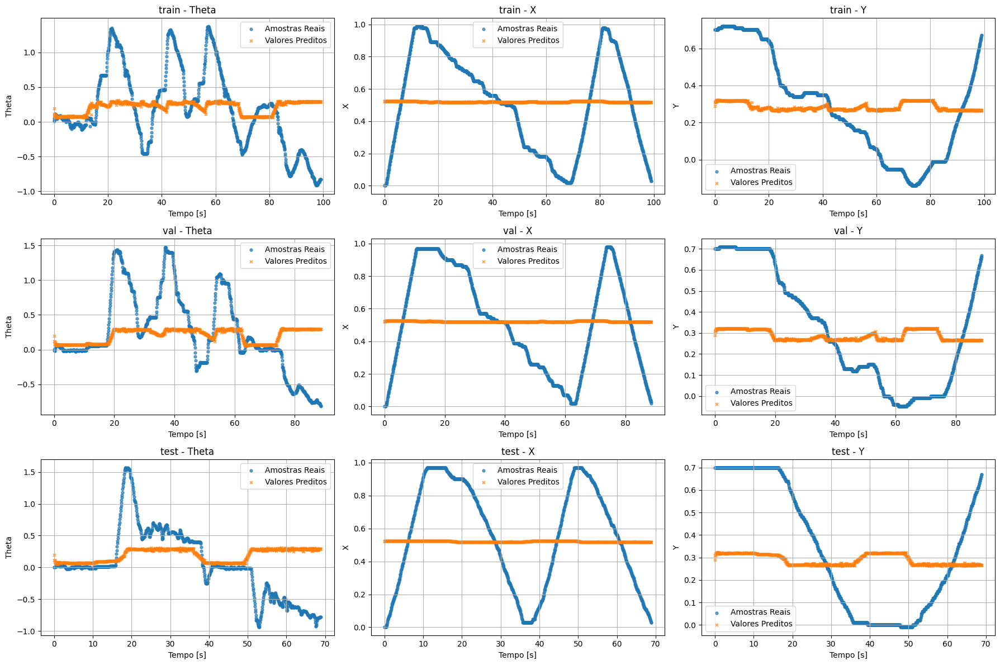

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step
Theta | train -> R² = 0.0442, MSE = 3.1442e-01
X | train -> R² = 0.0049, MSE = 9.1425e-02
Y | train -> R² = 0.0000, MSE = 7.6738e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | val -> R² = 0.0487, MSE = 3.1153e-01
X | val -> R² = -0.0019, MSE = 9.5661e-02
Y | val -> R² = -0.0097, MSE = 7.5115e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Theta | test -> R² = -0.0854, MSE = 3.1073e-01
X | test -> R² = 0.0015, MSE = 1.0137e-01
Y | test -> R² = -0.0316, MSE = 8.2091e-02


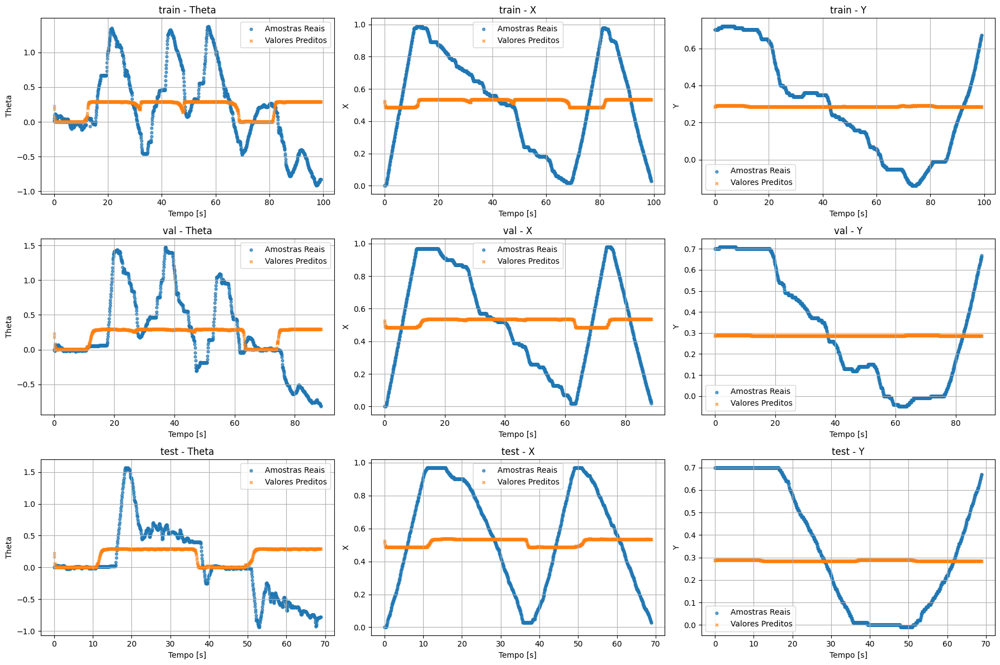

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0441, MSE = 3.1445e-01
X | train -> R² = 0.0047, MSE = 9.1446e-02
Y | train -> R² = 0.0000, MSE = 7.6738e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0489, MSE = 3.1149e-01
X | val -> R² = -0.0024, MSE = 9.5710e-02
Y | val -> R² = -0.0097, MSE = 7.5114e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0842, MSE = 3.1039e-01
X | test -> R² = 0.0007, MSE = 1.0145e-01
Y | test -> R² = -0.0309, MSE = 8.2039e-02


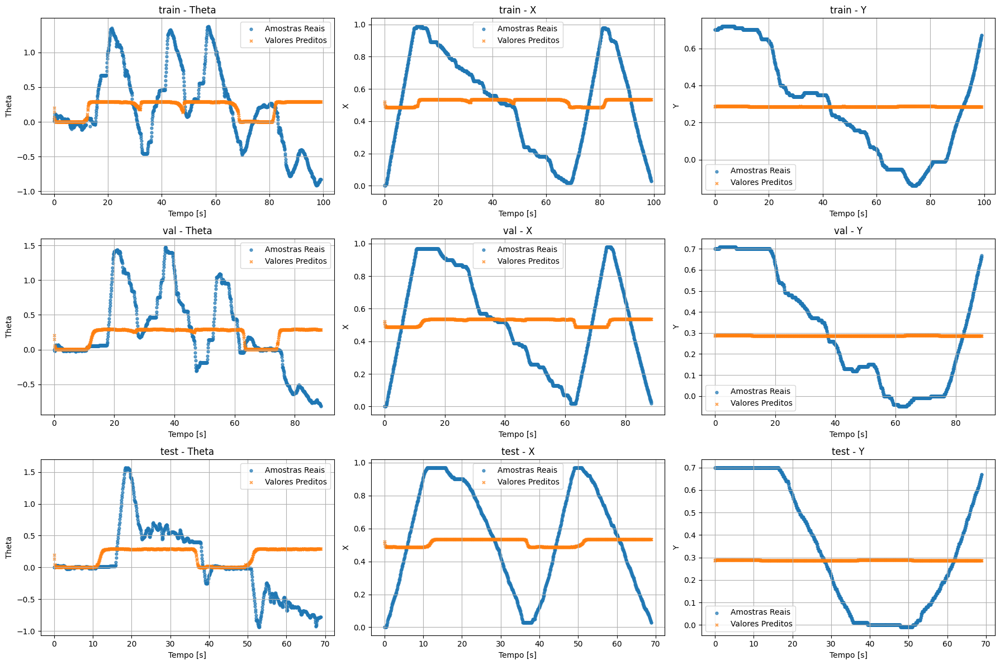

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Theta | train -> R² = 0.0079, MSE = 3.2636e-01
X | train -> R² = 0.0128, MSE = 9.0703e-02
Y | train -> R² = 0.0345, MSE = 7.4090e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | val -> R² = 0.0235, MSE = 3.1979e-01
X | val -> R² = 0.0108, MSE = 9.4444e-02
Y | val -> R² = 0.0622, MSE = 6.9763e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0877, MSE = 3.1140e-01
X | test -> R² = 0.0033, MSE = 1.0119e-01
Y | test -> R² = 0.0597, MSE = 7.4825e-02


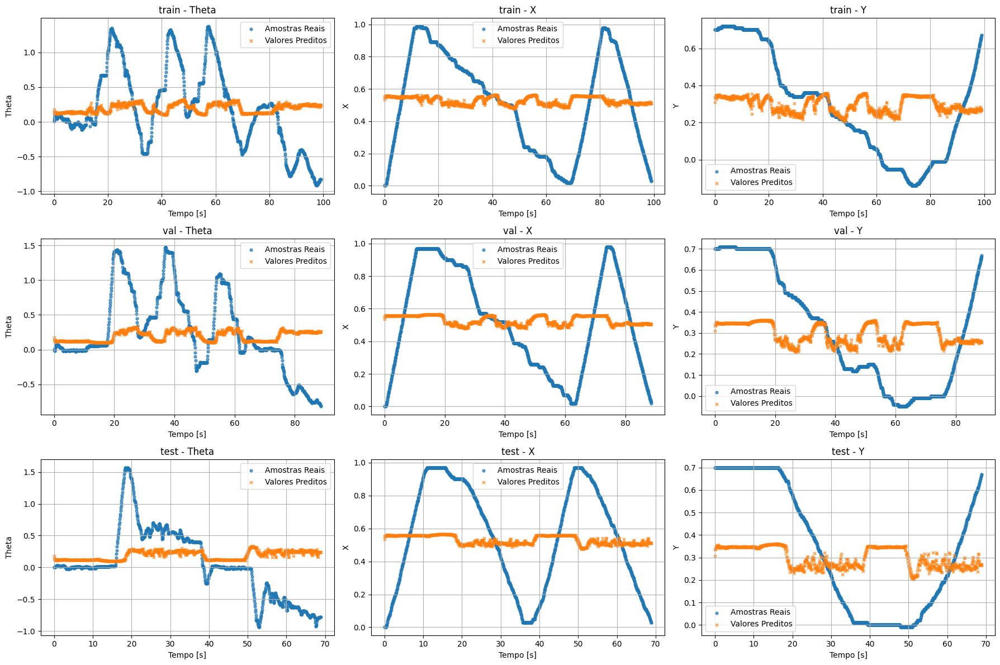

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Theta | train -> R² = 0.0563, MSE = 3.1044e-01
X | train -> R² = 0.0006, MSE = 9.1824e-02
Y | train -> R² = 0.0005, MSE = 7.6706e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0755, MSE = 3.0275e-01
X | val -> R² = -0.0072, MSE = 9.6169e-02
Y | val -> R² = 0.0010, MSE = 7.4316e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0807, MSE = 3.0941e-01
X | test -> R² = -0.0120, MSE = 1.0274e-01
Y | test -> R² = -0.0260, MSE = 8.1650e-02


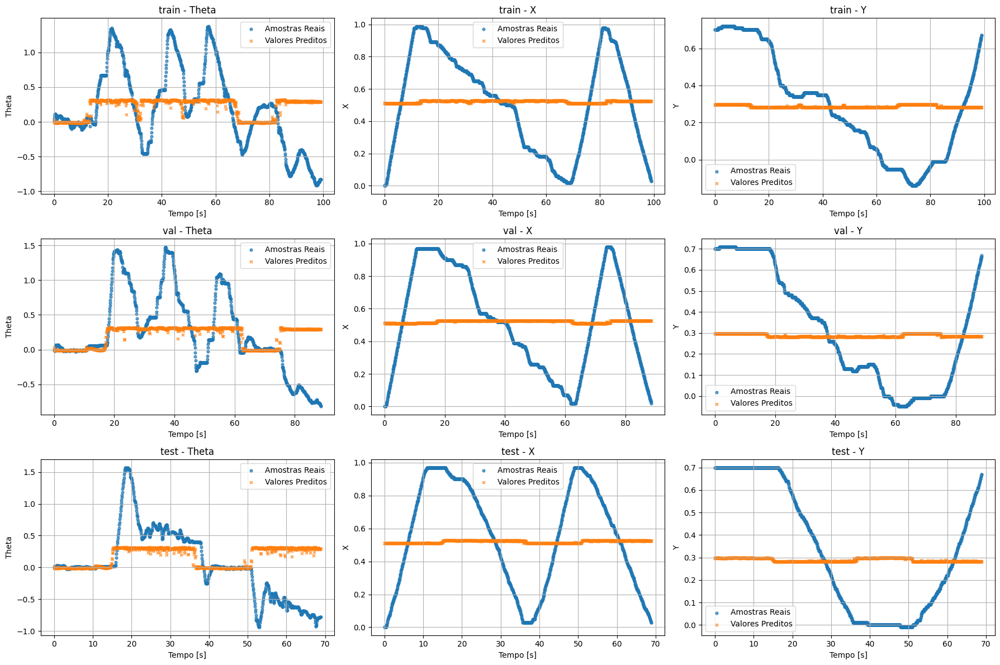

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0224, MSE = 3.2158e-01
X | train -> R² = 0.0260, MSE = 8.9488e-02
Y | train -> R² = 0.0551, MSE = 7.2514e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0344, MSE = 3.1623e-01
X | val -> R² = -0.0014, MSE = 9.5613e-02
Y | val -> R² = 0.0636, MSE = 6.9658e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0764, MSE = 3.0818e-01
X | test -> R² = 0.0029, MSE = 1.0123e-01
Y | test -> R² = 0.0636, MSE = 7.4518e-02


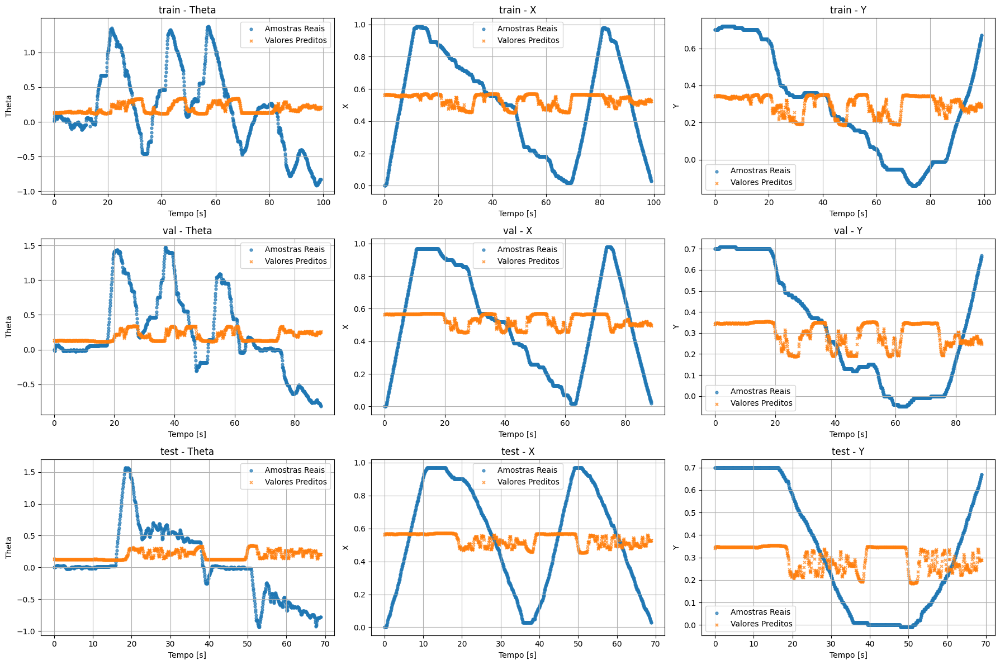

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0566, MSE = 3.1034e-01
X | train -> R² = 0.0005, MSE = 9.1828e-02
Y | train -> R² = 0.0005, MSE = 7.6705e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0762, MSE = 3.0254e-01
X | val -> R² = -0.0069, MSE = 9.6141e-02
Y | val -> R² = 0.0005, MSE = 7.4354e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0810, MSE = 3.0947e-01
X | test -> R² = -0.0115, MSE = 1.0269e-01
Y | test -> R² = -0.0260, MSE = 8.1644e-02


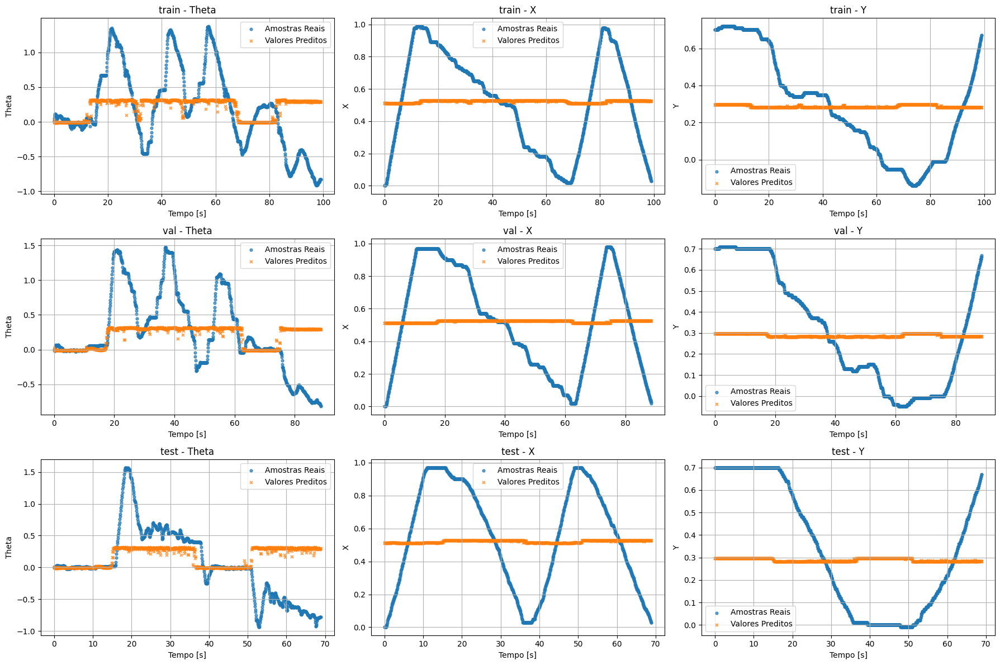

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0252, MSE = 3.2065e-01
X | train -> R² = -0.0001, MSE = 9.1887e-02
Y | train -> R² = 0.0031, MSE = 7.6504e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0433, MSE = 3.1331e-01
X | val -> R² = 0.0013, MSE = 9.5356e-02
Y | val -> R² = 0.0256, MSE = 7.2485e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0963, MSE = 3.1386e-01
X | test -> R² = -0.0130, MSE = 1.0284e-01
Y | test -> R² = -0.0026, MSE = 7.9784e-02


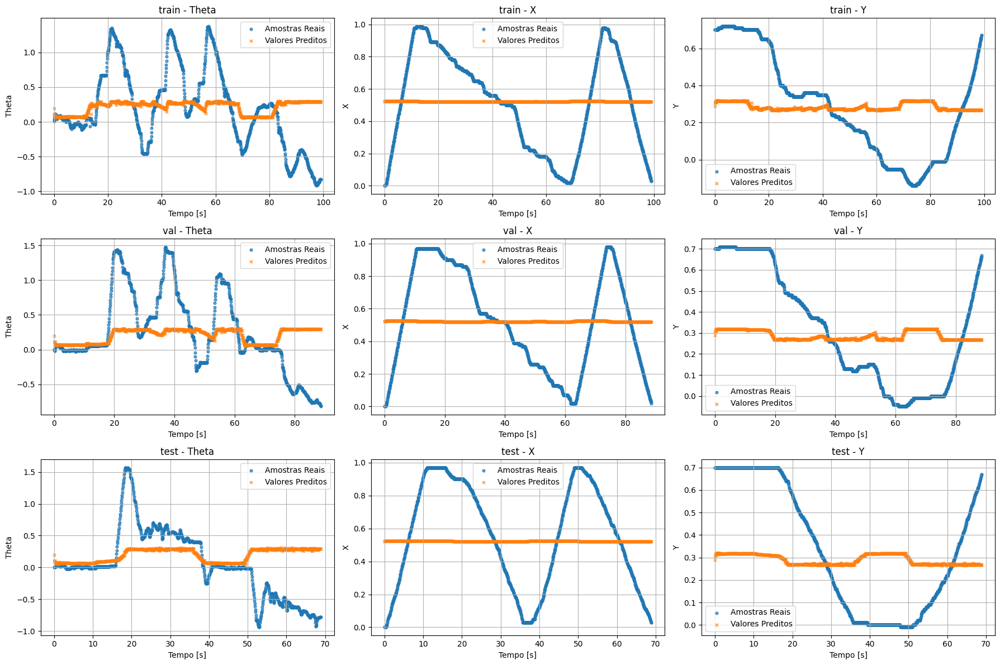

Modelo 7 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Theta | train -> R² = 0.0553, MSE = 3.1076e-01
X | train -> R² = 0.0006, MSE = 9.1823e-02
Y | train -> R² = 0.0005, MSE = 7.6700e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0734, MSE = 3.0346e-01
X | val -> R² = -0.0070, MSE = 9.6151e-02
Y | val -> R² = 0.0031, MSE = 7.4160e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | test -> R² = -0.0791, MSE = 3.0894e-01
X | test -> R² = -0.0127, MSE = 1.0281e-01
Y | test -> R² = -0.0256, MSE = 8.1612e-02


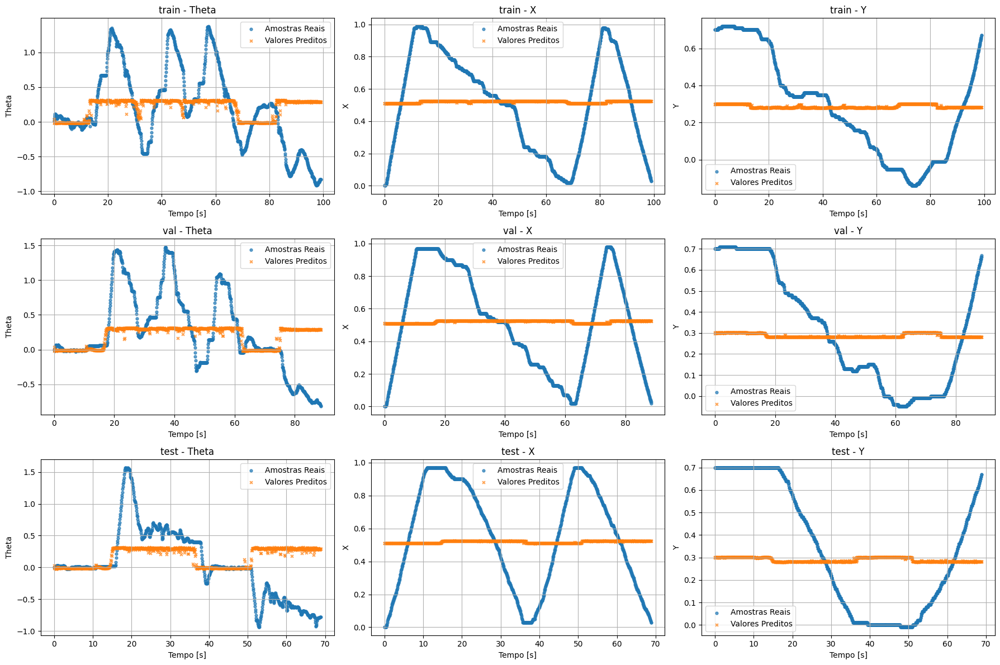

Modelo 8 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0531, MSE = 3.1150e-01
X | train -> R² = 0.0000, MSE = 9.1874e-02
Y | train -> R² = 0.0009, MSE = 7.6668e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0645, MSE = 3.0637e-01
X | val -> R² = -0.0021, MSE = 9.5680e-02
Y | val -> R² = 0.0082, MSE = 7.3780e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0861, MSE = 3.1095e-01
X | test -> R² = -0.0139, MSE = 1.0294e-01
Y | test -> R² = -0.0189, MSE = 8.1079e-02


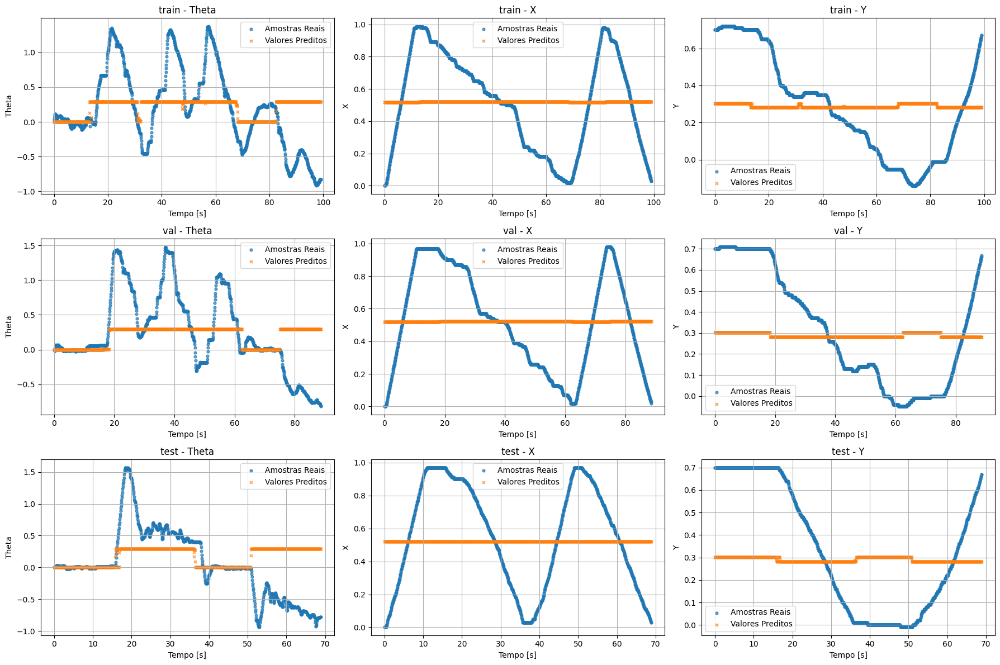

Modelo 9 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Theta | train -> R² = 0.1003, MSE = 2.9596e-01
X | train -> R² = 0.0317, MSE = 8.8964e-02
Y | train -> R² = 0.0365, MSE = 7.3940e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.1300, MSE = 2.8492e-01
X | val -> R² = 0.0560, MSE = 9.0129e-02
Y | val -> R² = 0.0838, MSE = 6.8155e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1215, MSE = 3.2106e-01
X | test -> R² = 0.0431, MSE = 9.7146e-02
Y | test -> R² = 0.0330, MSE = 7.6954e-02


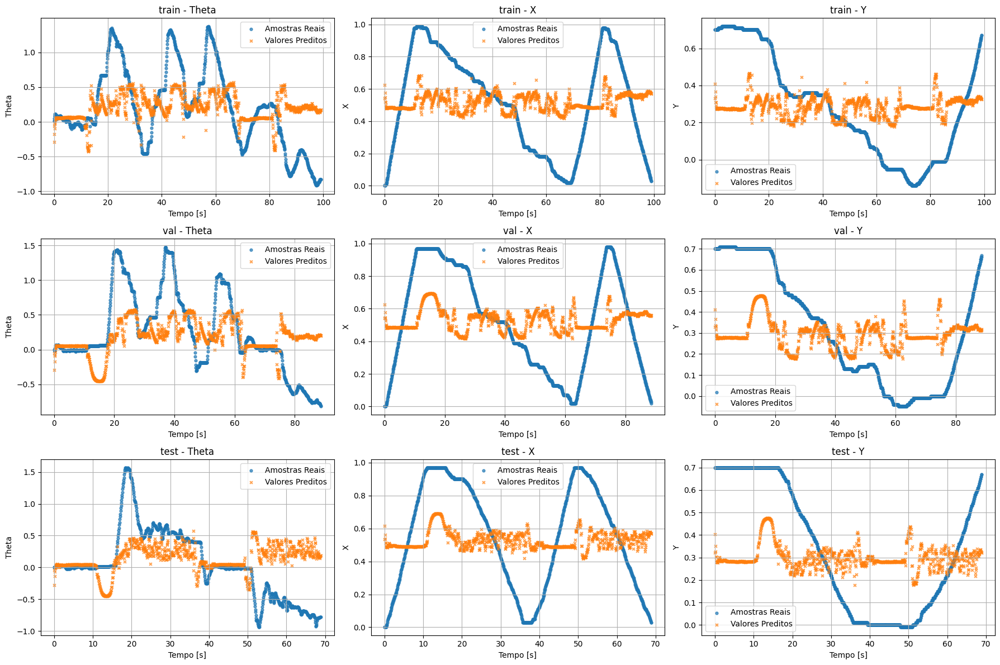

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Theta | train -> R² = 0.0454, MSE = 3.1403e-01
X | train -> R² = 0.0558, MSE = 8.6748e-02
Y | train -> R² = 0.0525, MSE = 7.2712e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0444, MSE = 3.1295e-01
X | val -> R² = 0.0201, MSE = 9.3558e-02
Y | val -> R² = 0.0657, MSE = 6.9502e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0754, MSE = 3.0788e-01
X | test -> R² = 0.0473, MSE = 9.6724e-02
Y | test -> R² = 0.0902, MSE = 7.2398e-02


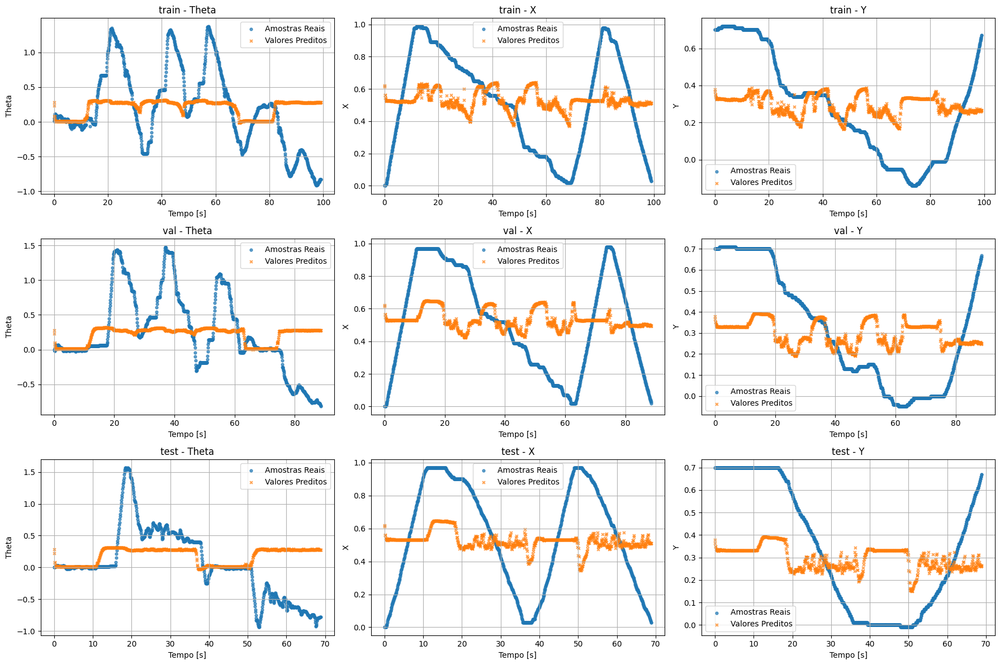

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0461, MSE = 3.1379e-01
X | train -> R² = 0.0322, MSE = 8.8920e-02
Y | train -> R² = 0.0319, MSE = 7.4295e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Theta | val -> R² = 0.0603, MSE = 3.0774e-01
X | val -> R² = 0.0159, MSE = 9.3960e-02
Y | val -> R² = 0.0559, MSE = 7.0234e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0781, MSE = 3.0864e-01
X | test -> R² = 0.0478, MSE = 9.6669e-02
Y | test -> R² = 0.0540, MSE = 7.5279e-02


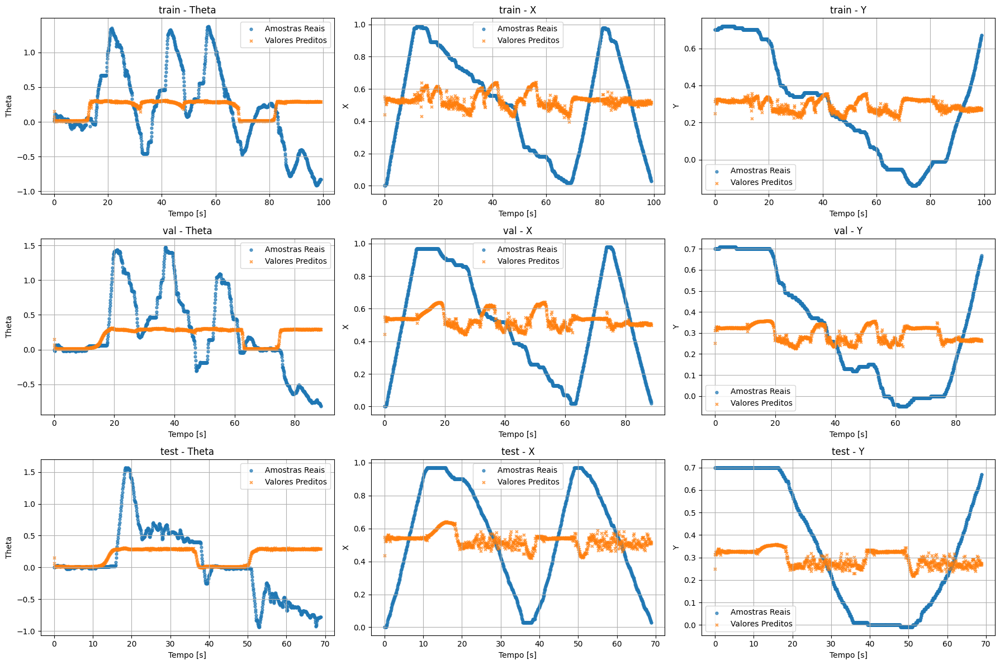

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0582, MSE = 3.0981e-01
X | train -> R² = 0.0513, MSE = 8.7164e-02
Y | train -> R² = 0.0386, MSE = 7.3776e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0922, MSE = 2.9729e-01
X | val -> R² = 0.0509, MSE = 9.0622e-02
Y | val -> R² = 0.0730, MSE = 6.8959e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1164, MSE = 3.1961e-01
X | test -> R² = 0.0683, MSE = 9.4588e-02
Y | test -> R² = 0.0461, MSE = 7.5913e-02


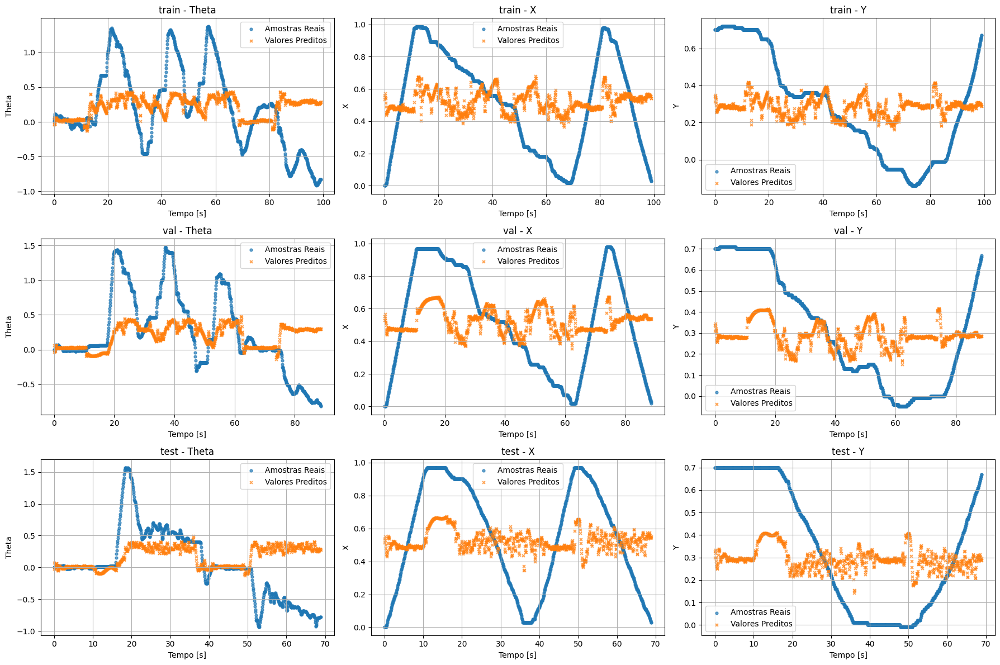

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.1250, MSE = 2.8783e-01
X | train -> R² = 0.0115, MSE = 9.0823e-02
Y | train -> R² = 0.0080, MSE = 7.6129e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.1740, MSE = 2.7052e-01
X | val -> R² = 0.0197, MSE = 9.3598e-02
Y | val -> R² = 0.0327, MSE = 7.1961e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0994, MSE = 3.1475e-01
X | test -> R² = 0.0048, MSE = 1.0104e-01
Y | test -> R² = -0.0183, MSE = 8.1037e-02


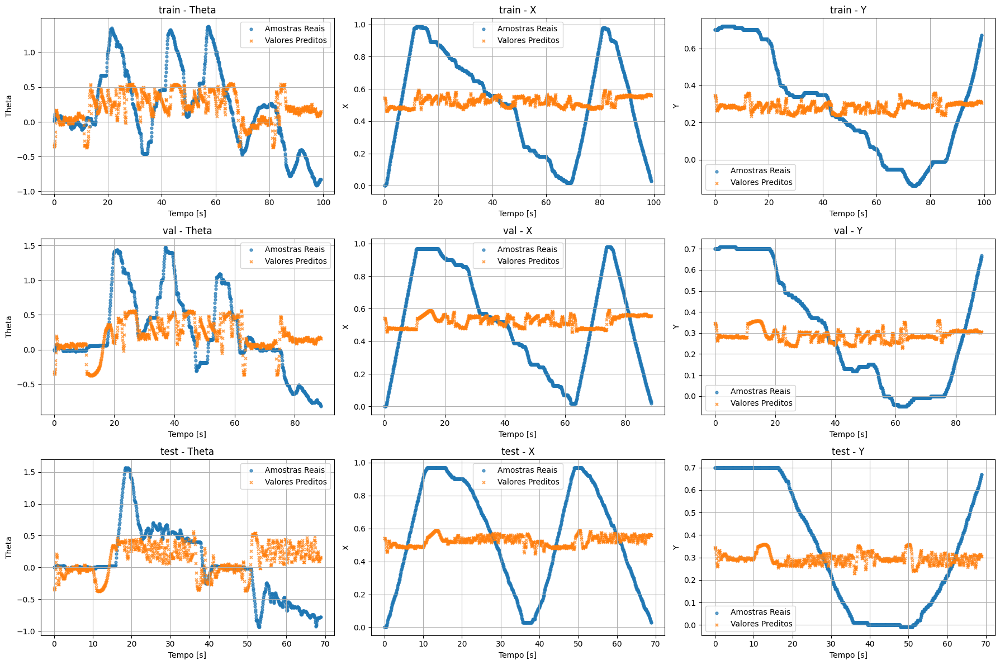

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
Theta | train -> R² = 0.1408, MSE = 2.8263e-01
X | train -> R² = 0.0154, MSE = 9.0460e-02
Y | train -> R² = 0.0300, MSE = 7.4438e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.2406, MSE = 2.4870e-01
X | val -> R² = 0.0091, MSE = 9.4609e-02
Y | val -> R² = 0.0454, MSE = 7.1015e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.1004, MSE = 3.1502e-01
X | test -> R² = 0.0026, MSE = 1.0126e-01
Y | test -> R² = -0.0141, MSE = 8.0699e-02


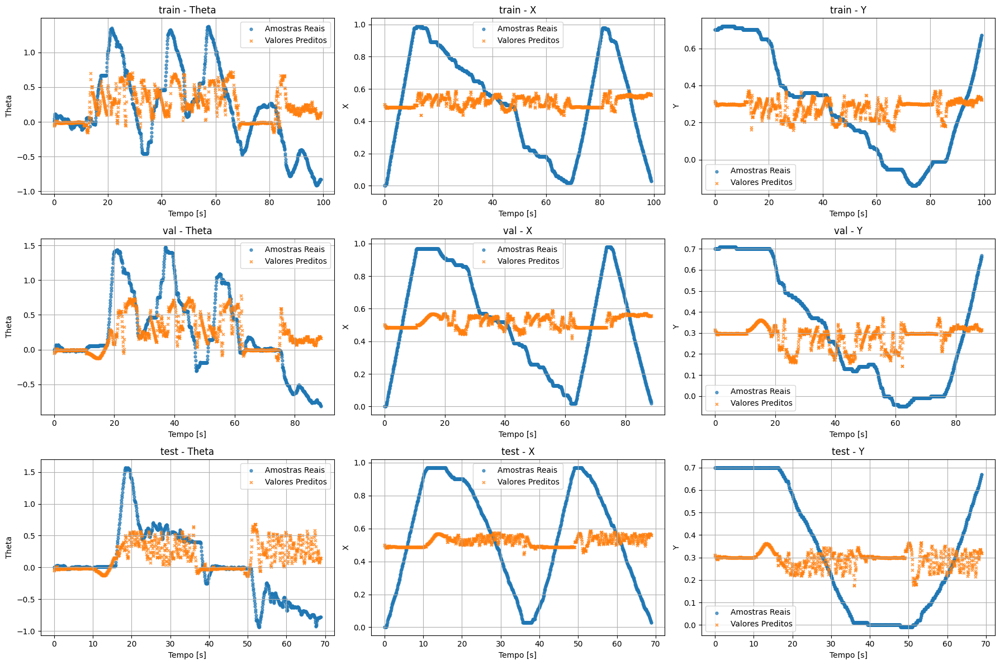

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0334, MSE = 3.1795e-01
X | train -> R² = 0.0009, MSE = 9.1797e-02
Y | train -> R² = 0.0008, MSE = 7.6680e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0539, MSE = 3.0984e-01
X | val -> R² = -0.0064, MSE = 9.6093e-02
Y | val -> R² = 0.0118, MSE = 7.3515e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0979, MSE = 3.1433e-01
X | test -> R² = -0.0118, MSE = 1.0272e-01
Y | test -> R² = -0.0170, MSE = 8.0933e-02


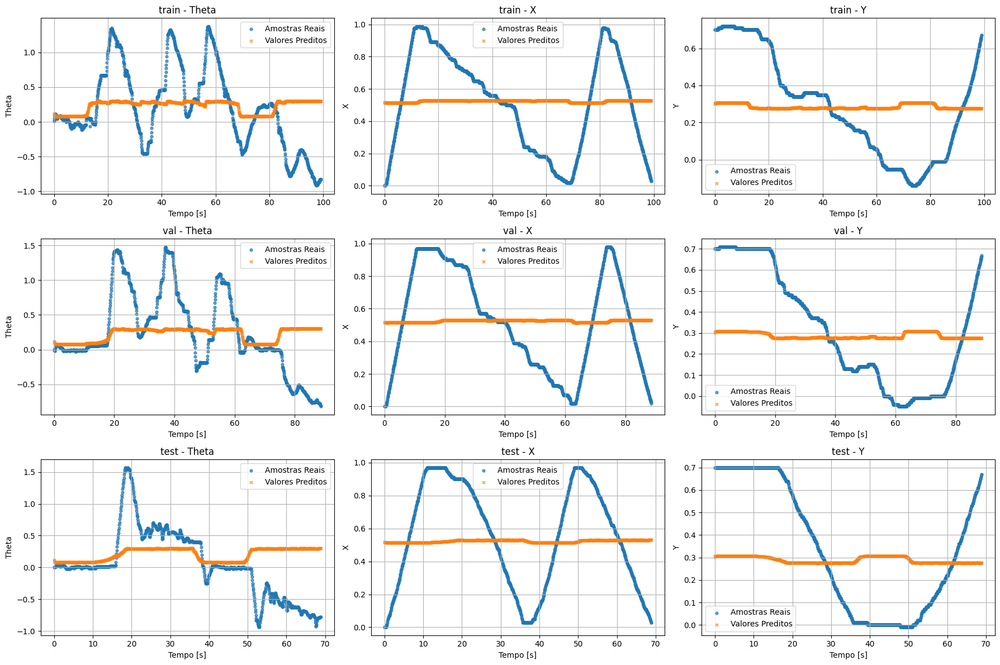

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0215, MSE = 3.2189e-01
X | train -> R² = 0.0237, MSE = 8.9699e-02
Y | train -> R² = 0.0470, MSE = 7.3134e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Theta | val -> R² = 0.0223, MSE = 3.2020e-01
X | val -> R² = 0.0080, MSE = 9.4716e-02
Y | val -> R² = 0.0777, MSE = 6.8612e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Theta | test -> R² = -0.0776, MSE = 3.0851e-01
X | test -> R² = 0.0302, MSE = 9.8456e-02
Y | test -> R² = 0.1031, MSE = 7.1371e-02


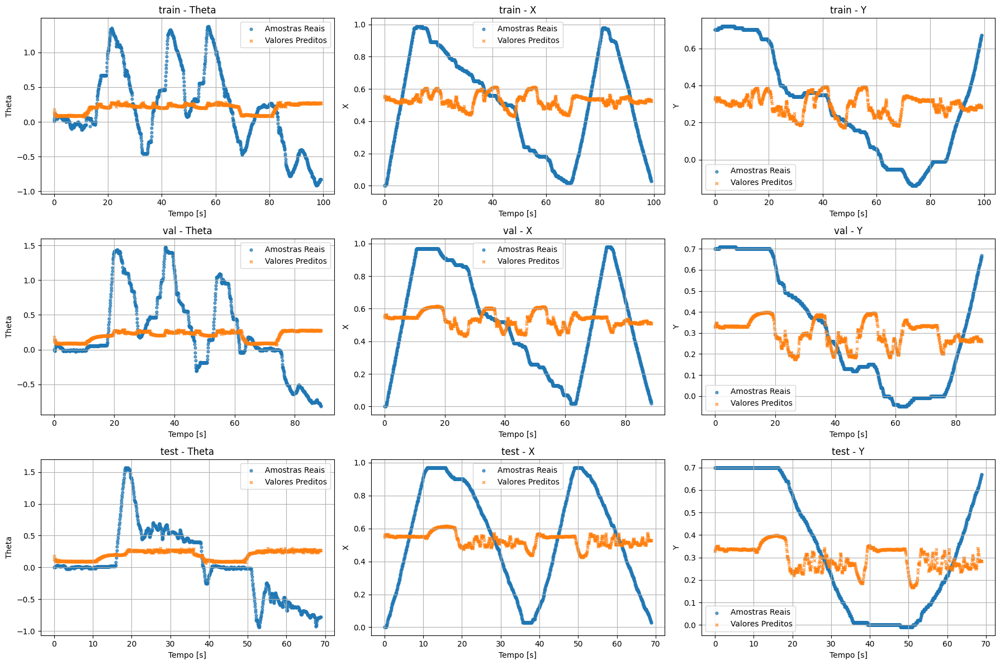

Modelo 7 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.1034, MSE = 2.9495e-01
X | train -> R² = 0.0260, MSE = 8.9490e-02
Y | train -> R² = 0.0732, MSE = 7.1127e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0669, MSE = 3.0560e-01
X | val -> R² = -0.0149, MSE = 9.6902e-02
Y | val -> R² = 0.0635, MSE = 6.9667e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.1196, MSE = 3.2052e-01
X | test -> R² = 0.0000, MSE = 1.0152e-01
Y | test -> R² = 0.0319, MSE = 7.7039e-02


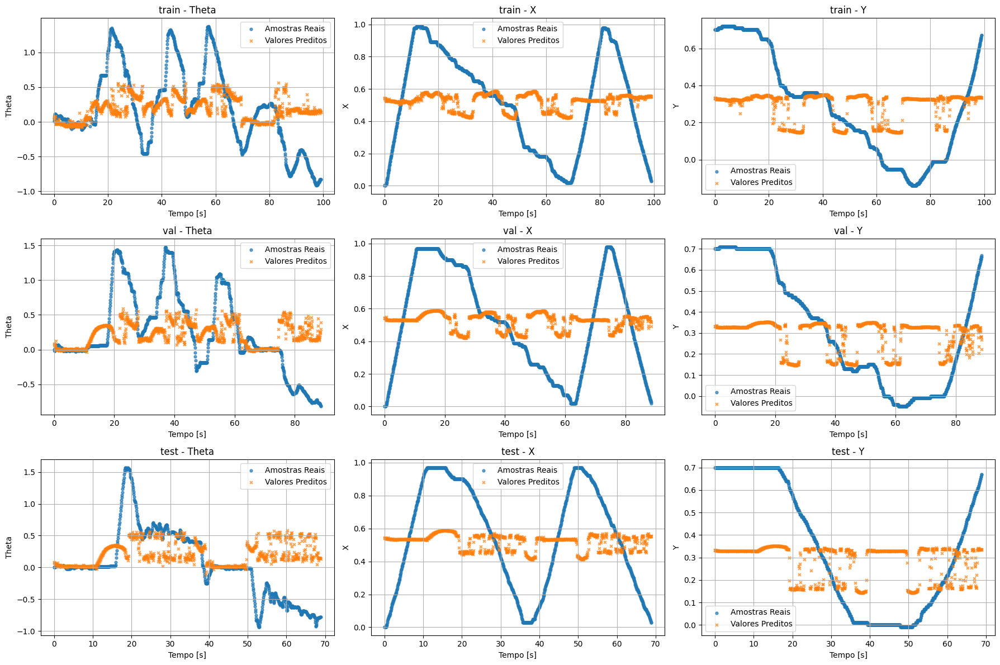

Modelo 8 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0450, MSE = 3.1414e-01
X | train -> R² = 0.0260, MSE = 8.9491e-02
Y | train -> R² = 0.0642, MSE = 7.1815e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0740, MSE = 3.0324e-01
X | val -> R² = -0.0254, MSE = 9.7900e-02
Y | val -> R² = 0.0595, MSE = 6.9966e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | test -> R² = -0.0810, MSE = 3.0947e-01
X | test -> R² = -0.0219, MSE = 1.0374e-01
Y | test -> R² = 0.0476, MSE = 7.5791e-02


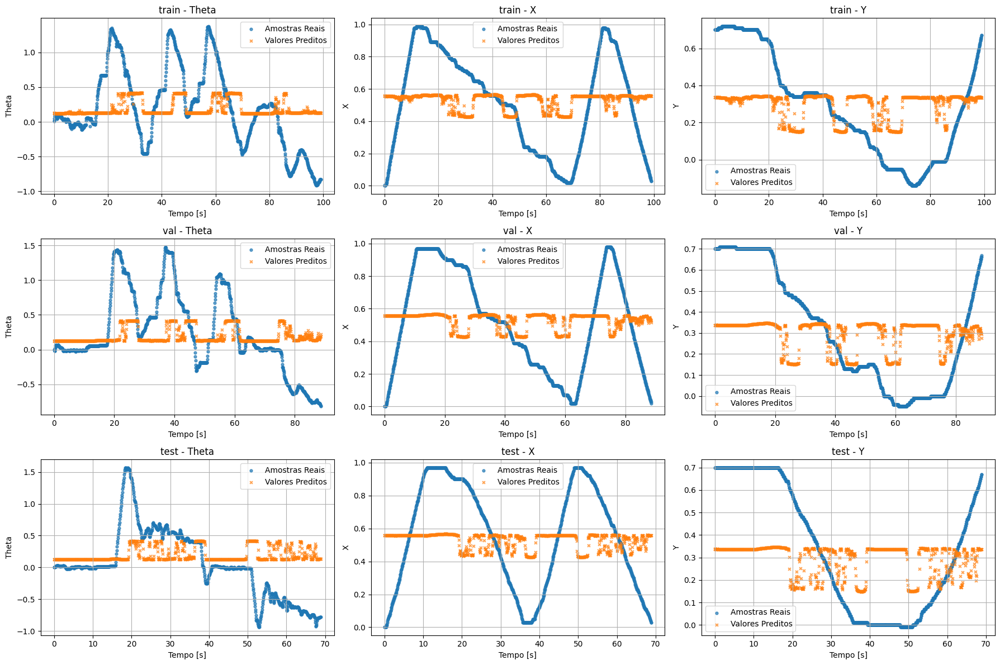

Modelo 9 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.2490, MSE = 2.4704e-01
X | train -> R² = 0.0407, MSE = 8.8135e-02
Y | train -> R² = 0.0777, MSE = 7.0775e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.3011, MSE = 2.2887e-01
X | val -> R² = -0.0313, MSE = 9.8465e-02
Y | val -> R² = 0.0259, MSE = 7.2466e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.2424, MSE = 3.5570e-01
X | test -> R² = -0.0534, MSE = 1.0695e-01
Y | test -> R² = -0.0578, MSE = 8.4176e-02


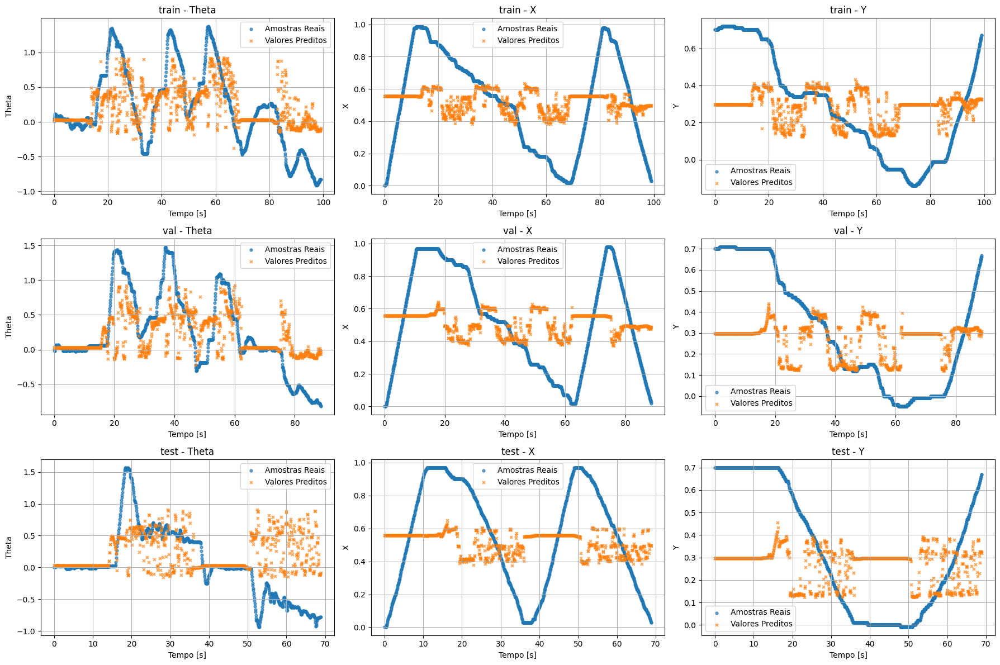

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0305, MSE = 3.1892e-01
X | train -> R² = 0.0272, MSE = 8.9378e-02
Y | train -> R² = 0.0390, MSE = 7.3751e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0445, MSE = 3.1292e-01
X | val -> R² = 0.0108, MSE = 9.4452e-02
Y | val -> R² = 0.0466, MSE = 7.0925e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0962, MSE = 3.1383e-01
X | test -> R² = 0.0353, MSE = 9.7939e-02
Y | test -> R² = 0.0578, MSE = 7.4977e-02


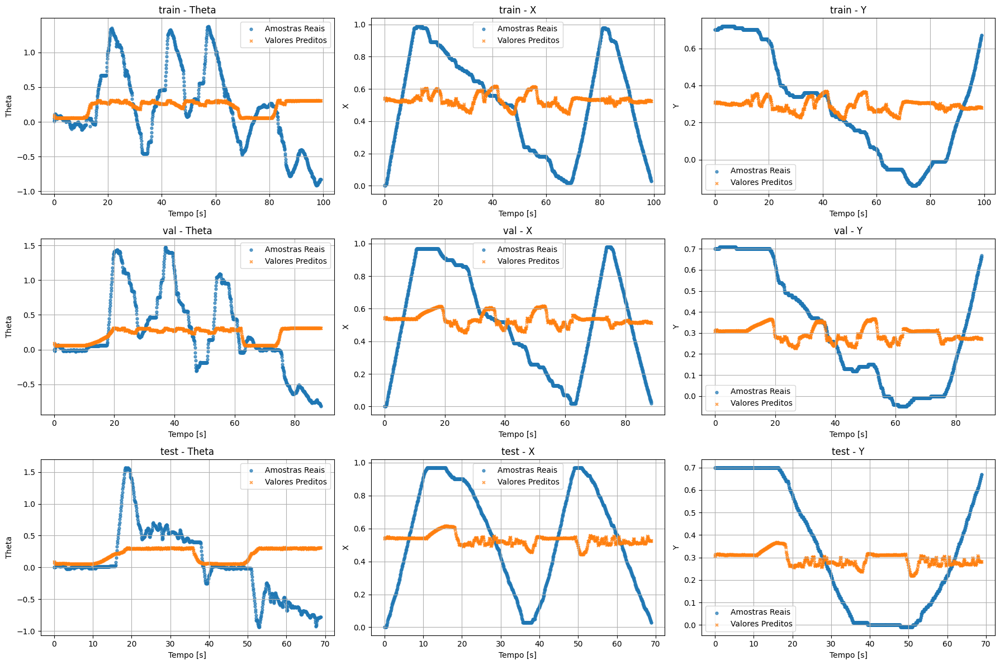

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.1987, MSE = 2.6360e-01
X | train -> R² = 0.0653, MSE = 8.5877e-02
Y | train -> R² = 0.0903, MSE = 6.9810e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.2286, MSE = 2.5264e-01
X | val -> R² = -0.0066, MSE = 9.6113e-02
Y | val -> R² = 0.0545, MSE = 7.0337e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.1889, MSE = 3.4037e-01
X | test -> R² = 0.0215, MSE = 9.9341e-02
Y | test -> R² = 0.0191, MSE = 7.8054e-02


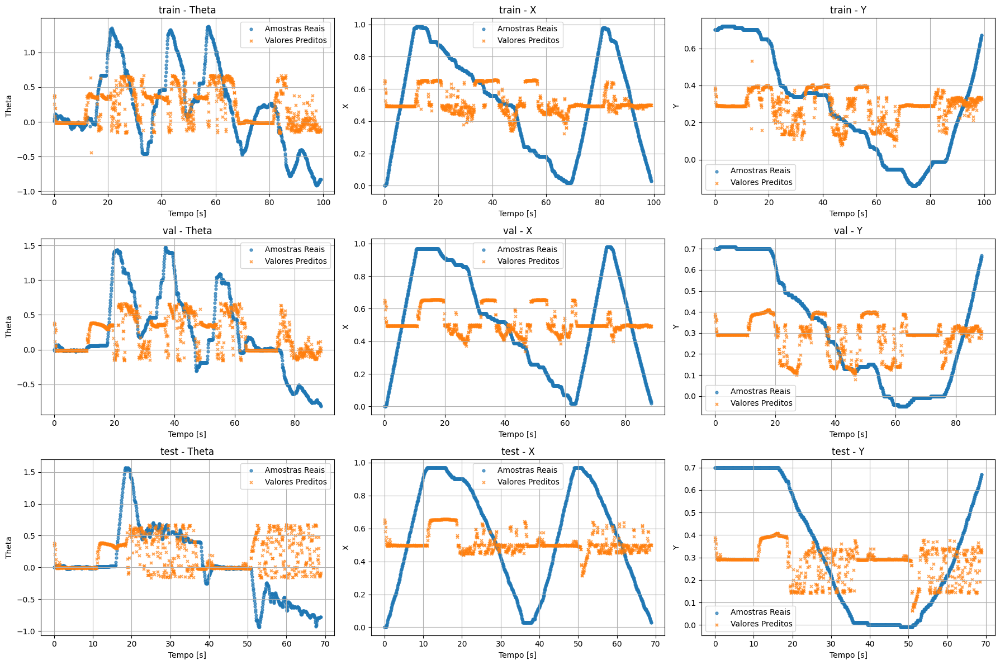

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Theta | train -> R² = 0.0443, MSE = 3.1437e-01
X | train -> R² = 0.0164, MSE = 9.0375e-02
Y | train -> R² = 0.0327, MSE = 7.4228e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0537, MSE = 3.0990e-01
X | val -> R² = 0.0118, MSE = 9.4356e-02
Y | val -> R² = 0.0795, MSE = 6.8474e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0643, MSE = 3.0471e-01
X | test -> R² = 0.0304, MSE = 9.8436e-02
Y | test -> R² = 0.0926, MSE = 7.2210e-02


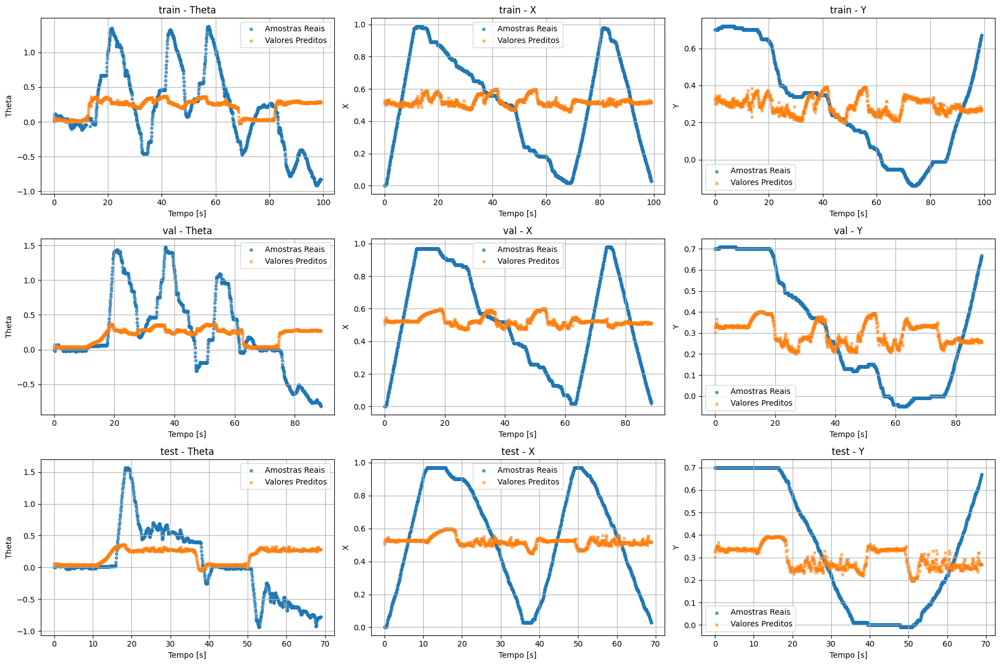

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
Theta | train -> R² = 0.0302, MSE = 3.1903e-01
X | train -> R² = 0.0326, MSE = 8.8881e-02
Y | train -> R² = 0.0220, MSE = 7.5055e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0418, MSE = 3.1381e-01
X | val -> R² = 0.0072, MSE = 9.4792e-02
Y | val -> R² = 0.0196, MSE = 7.2931e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0829, MSE = 3.1002e-01
X | test -> R² = 0.0298, MSE = 9.8496e-02
Y | test -> R² = 0.0125, MSE = 7.8583e-02


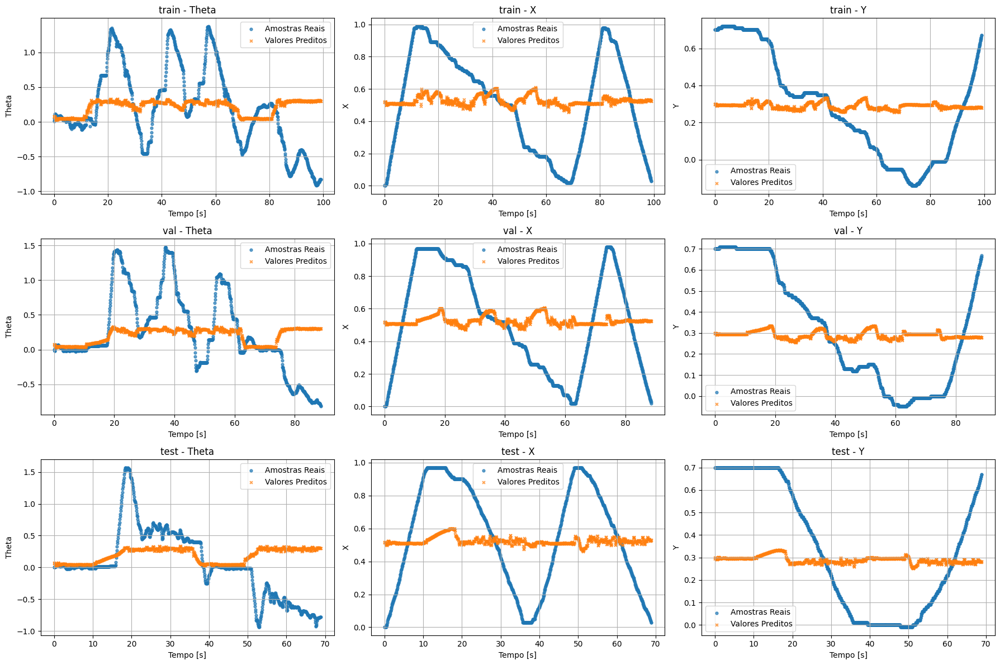

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.2335, MSE = 2.5213e-01
X | train -> R² = 0.0502, MSE = 8.7263e-02
Y | train -> R² = 0.0650, MSE = 7.1749e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.2667, MSE = 2.4015e-01
X | val -> R² = -0.0128, MSE = 9.6704e-02
Y | val -> R² = 0.0374, MSE = 7.1606e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | test -> R² = -0.2405, MSE = 3.5515e-01
X | test -> R² = -0.0058, MSE = 1.0211e-01
Y | test -> R² = -0.0262, MSE = 8.1667e-02


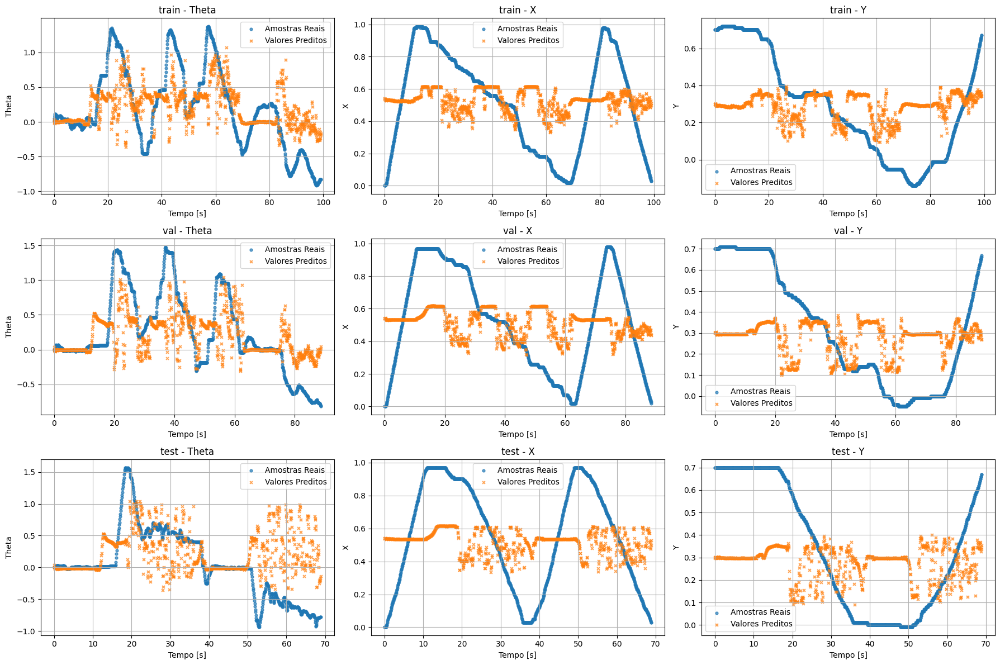

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0273, MSE = 3.1996e-01
X | train -> R² = 0.0167, MSE = 9.0339e-02
Y | train -> R² = 0.0180, MSE = 7.5360e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0451, MSE = 3.1271e-01
X | val -> R² = -0.0027, MSE = 9.5732e-02
Y | val -> R² = 0.0281, MSE = 7.2299e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0947, MSE = 3.1341e-01
X | test -> R² = 0.0022, MSE = 1.0130e-01
Y | test -> R² = 0.0112, MSE = 7.8683e-02


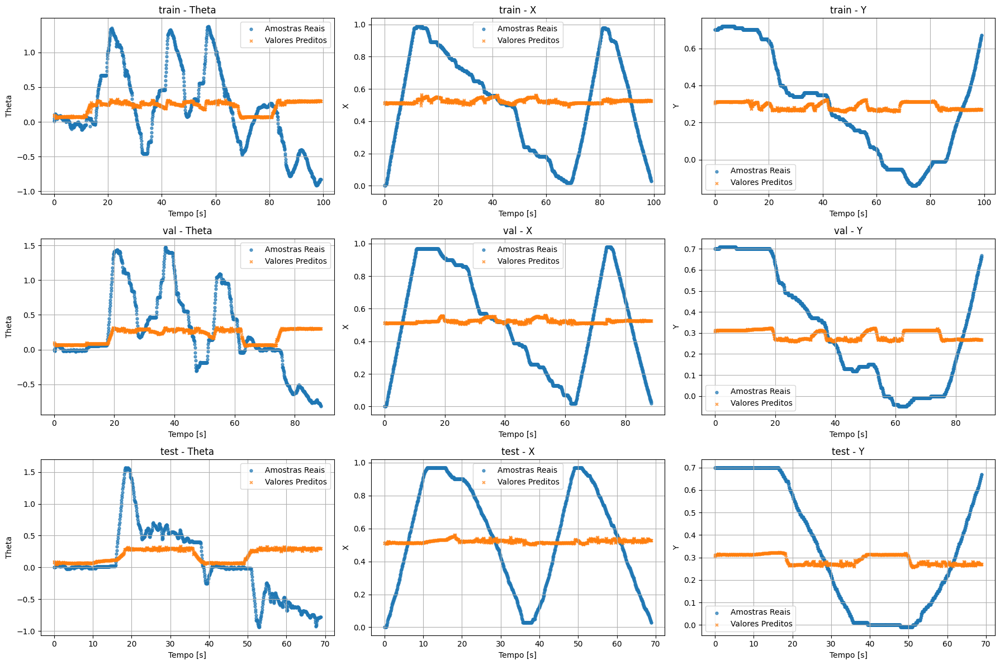

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Theta | train -> R² = 0.0473, MSE = 3.1340e-01
X | train -> R² = 0.0609, MSE = 8.6285e-02
Y | train -> R² = 0.0476, MSE = 7.3091e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0389, MSE = 3.1475e-01
X | val -> R² = 0.0281, MSE = 9.2794e-02
Y | val -> R² = 0.0616, MSE = 6.9809e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0701, MSE = 3.0635e-01
X | test -> R² = 0.0448, MSE = 9.6973e-02
Y | test -> R² = 0.0914, MSE = 7.2307e-02


In [ ]:
import numpy as np
import pandas as pd
from tensorflow import keras
from keras.callbacks import EarlyStopping
from keras import initializers

# tamanho da entrada
INPUT_SIZE = len(PREDICTORS)  
OUTPUT_SIZE = len(TARGET) 
N_MODELS = 10  # número de inicializações

seeds = np.random.choice(range(1, 10000), size=N_MODELS, replace=False)
neurons = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 19, 20, 21, 22, 23, 24, 25]
results = {}
excel_file = "resultados.xlsx"

for n in neurons:
    for i, s in enumerate(seeds):

        initializer = initializers.RandomNormal(seed=int(s))

        # cria modelo
        model = keras.models.Sequential([
            keras.layers.Input(shape=(TIME_STEPS, INPUT_SIZE)),
            keras.layers.SimpleRNN(n, activation="tanh", kernel_initializer=initializer),
            keras.layers.Dense(OUTPUT_SIZE, activation="linear", kernel_initializer=initializer),  
        ])
        
        # salva pesos iniciais
        w0 = model.get_weights()

        # compila
        model.compile(loss="mean_squared_error", optimizer="adam")
        early_stopping_monitor = EarlyStopping(
            monitor='val_loss',
            patience=50,
            restore_best_weights=True
        )

        # treina
        history = model.fit(
            x_train, 
            y_train, 
            epochs=500,
            callbacks=[early_stopping_monitor],
            validation_data=(x_val, y_val),
            verbose=0
        )

        # salva pesos finais
        wf = model.get_weights()

       # avalia o modelo
        metrics = EvalModel(model)

        row = {
            "model": f"model_{n}_{i}",
            "Neurons": n,
            # ---- Pesos ----
            "W0": str([w.round(4).tolist() for w in w0]),
            "Wf": str([w.round(4).tolist() for w in wf]),
        }

        for name in TARGET:
            row.update({
                f"R2_Train_{name}": metrics[name]["R2_train"],
                f"MSE_Train_{name}": metrics[name]["MSE_train"],
                f"R2_Val_{name}": metrics[name]["R2_val"],
                f"MSE_Val_{name}": metrics[name]["MSE_val"],
                f"R2_Test_{name}": metrics[name]["R2_test"],
                f"MSE_Test_{name}": metrics[name]["MSE_test"],
            })

        df = pd.DataFrame([row])

        # salva/atualiza Excel incrementalmente
        try:
            # tenta abrir existente e adicionar linha
            old = pd.read_excel(excel_file)
            new_df = pd.concat([old, df], ignore_index=True)
            new_df.to_excel(excel_file, index=False)
        except FileNotFoundError:
            # se não existir, cria arquivo novo
            df.to_excel(excel_file, index=False)

        print(f"Modelo {i} treinado e salvo no Excel")